# Fingerprint-based similarity scores - ranking task

## Challenge
Often, fingerprints are used to find best matches in a dataaset or library. In this case, only the top-ranked similarities matter and it is not really important if a pair of mostly dissimilar compounds is placed in the 20 or 30% lowest percent.
Data:

Compare multiple fingerprints on the "ms2structures" dataset.

In [18]:
import os
import pickle
import sys
from pathlib import Path

import multiprocessing as mp
import numpy as np
import pandas as pd
from joblib import Parallel, delayed
from matplotlib import pyplot as plt
from rdkit import Chem
from rdkit.Chem import Descriptors
from tqdm.notebook import tqdm

ROOT = Path(os.getcwd()).parents[0]
path_data = os.path.join(Path(ROOT), "data")

In [19]:
from chemap.fingerprint_computation import compute_fingerprints, FingerprintConfig

# import fingerprint algorithms
from rdkit.Chem import rdFingerprintGenerator
from skfp.fingerprints import (
    MACCSFingerprint, 
    PharmacophoreFingerprint,
    PubChemFingerprint,
    KlekotaRothFingerprint,
    #LingoFingerprint, #MAPFingerprint,
    AvalonFingerprint,
)
from chemap.fingerprints import MAP4FPGen, LingoFingerprint

In [20]:
filename = "compounds_ms2structures.csv"
compounds = pd.read_csv(os.path.join(path_data, filename))
compounds.head()

,inchikey,smiles,mass,cf_class,cf_subclass,cf_superclass,formula,npc_class_results,npc_pathway_results,npc_superclass_results
0,AAAQFGUYHFJNHI,CCNC(=O)C[C@H]1C2=NN=C(N2C3=C(C=C(C=C3)OC)C(=N...,423.146204,Benzodiazepines,"1,4-benzodiazepines",Organoheterocyclic compounds,C22H22ClN5O2,NaN,Alkaloids,NaN
1,AABFWJDLCCDJJN,COC1=CC2=C(C=C1)NC3=C2C=CN=C3C4=CC=CC5=CC=CC=C54,324.126264,Harmala alkaloids,NaN,Alkaloids and derivatives,C22H16N2O,Carboline alkaloids,Alkaloids,Tryptophan alkaloids
2,AABILZKQMVKFHP,C/C=C(/C)\C(=O)O[C@H]1CC[N+]2([C@@H]1C(=CC2)CO...,427.220624,NaN,NaN,Alkaloids and derivatives,C21H33NO8,Pyrrolizidine alkaloids,Alkaloids,Ornithine alkaloids
3,AABUHSBGEIUSRJ,CC(=O)NC1=CC=C(C=C1)NC(=O)C=CC2=CC=CC=C2,280.120724,Cinnamic acids and derivatives,Cinnamic acid amides,Phenylpropanoids and polyketides,C17H16N2O2,Cinnamic acid amides,Shikimates and Phenylpropanoids,Phenylpropanoids (C6-C3)
4,AABUKWVVUWBZCS,C1=CC=C(C=C1)C2=C(C(=O)OC3=C2C=CC(=C3)O)C4=CC=...,314.094724,Neoflavonoids,Neoflavones,Phenylpropanoids and polyketides,C21H14O3,Neoflavonoids,Shikimates and Phenylpropanoids,Flavonoids


## Compute percentile scores and compare

In [4]:
from dataclasses import dataclass
from typing import Any, Dict, List, Optional, Sequence

import numpy as np
import scipy.sparse as sp
from joblib import Parallel, delayed
from sklearn.base import BaseEstimator, TransformerMixin

from biosynfoni import Biosynfoni


class BiosynfoniTransformer(BaseEstimator, TransformerMixin):
    """
    sklearn-style wrapper around Biosynfoni.

    Inputs to fit/transform: Sequence[rdkit.Chem.Mol]
    Output:
      - variant="folded": (N, D) dense float32 or CSR float32 (if sparse=True)
      - variant="raw_bits": same as above; chemap will convert to unfolded if cfg.folded=False
        (for Biosynfoni, raw feature space is already 0..D-1, so "raw_bits" == "folded")
    """

    def __init__(
        self,
        *,
        sparse: bool = False,
        variant: str = "folded",   # chemap may set this to "raw_bits"
        n_jobs: int = 1,
        verbose: int = 0,
    ):
        self.sparse = sparse
        self.variant = variant
        self.n_jobs = n_jobs
        self.verbose = verbose

    def fit(self, X: Sequence[Any], y: Any = None) -> "BiosynfoniTransformer":
        # No training needed, but sklearn expects fit() to exist.
        return self

    def transform(self, X: Sequence[Any]):
        # X is expected to be a list of RDKit mols (some may be None depending on your mol pipeline)
        def fp_row(mol) -> np.ndarray:
            if mol is None:
                # let chemap decide what to do with invalids; here we return empty and let caller handle
                return np.array([], dtype=np.float32)
            arr = np.asarray(Biosynfoni(mol).fingerprint, dtype=np.float32)
            return arr

        rows: List[np.ndarray] = Parallel(n_jobs=self.n_jobs)(
            delayed(fp_row)(mol) for mol in X
        )

        # Infer D from first non-empty row
        D = next((r.shape[0] for r in rows if r.size), 0)

        # Backfill empties to keep rectangular output (chemap currently passes only valid mols,
        # but this also makes the transformer robust if you change that later)
        for i, r in enumerate(rows):
            if r.size == 0 and D:
                rows[i] = np.zeros((D,), dtype=np.float32)

        X_dense = np.vstack(rows).astype(np.float32, copy=False) if rows else np.zeros((0, D), dtype=np.float32)

        if not self.sparse:
            return X_dense

        return sp.csr_matrix(X_dense, dtype=np.float32)


In [21]:
# ------------------------
# Define experiments
# ------------------------
invgen = rdFingerprintGenerator.GetMorganFeatureAtomInvGen()  # == useFeatures=True
    
FP_SIZE = 4096  # for all fingerprints with variable bit sizes

experiments = [
    # --- Morgan / ECFP (RDKit generators) ---
    #("morgan2_count",  rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=FP_SIZE), True),
    #("morgan2_binary", rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=FP_SIZE), False),
    ("morgan3_count",  rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE), True),
    ("morgan3_logcount",  rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE), True),
    ("morgan3_binary", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE), False),
    ("morgan9_count", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE), True),
    ("morgan9_logcount", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE), True),
    ("morgan9_binary", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE), False),
    ("fcfp3_count",  rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), True),
    ("fcfp9_count", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), True),
    ("fcfp3_logcount",  rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), True),
    ("fcfp9_logcount", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), True),
    ("fcfp3_binary", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), False),
    ("fcfp9_binary", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=FP_SIZE, atomInvariantsGenerator=invgen), False),
    
    # --- path-based fingerprint (RDKitFP) ---
    ("rdkit_count", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=FP_SIZE), True),
    ("rdkit_logcount", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=FP_SIZE), True),
    ("rdkit_binary", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=FP_SIZE), False),
    ("avalon_binary", AvalonFingerprint(fp_size=FP_SIZE, count=False, sparse=False), False),
    ("avalon_count", AvalonFingerprint(fp_size=FP_SIZE, count=True, sparse=False), True),
    ("avalon_logcount", AvalonFingerprint(fp_size=FP_SIZE, count=True, sparse=False), True),
    
    # --- Complementary classic hashed fingerprints via RDKit generators ---
    # Atom Pair + Topological Torsion are standard alternatives to circular fingerprints
    ("atompair_binary", rdFingerprintGenerator.GetAtomPairGenerator(fpSize=FP_SIZE), False),
    ("atompair_count", rdFingerprintGenerator.GetAtomPairGenerator(fpSize=FP_SIZE), True),
    ("atompair_logcount", rdFingerprintGenerator.GetAtomPairGenerator(fpSize=FP_SIZE), True),
    ("ttorsion_binary", rdFingerprintGenerator.GetTopologicalTorsionGenerator(fpSize=FP_SIZE), False),
    ("ttorsion_count", rdFingerprintGenerator.GetTopologicalTorsionGenerator(fpSize=FP_SIZE), True),
    ("ttorsion_logcount", rdFingerprintGenerator.GetTopologicalTorsionGenerator(fpSize=FP_SIZE), True),

    # String based
    ("lingo_binary", LingoFingerprint(fp_size=FP_SIZE, count=False, sparse=False), False),
    ("lingo_count", LingoFingerprint(fp_size=FP_SIZE, count=True, sparse=False), True),
    ("lingo_logcount", LingoFingerprint(fp_size=FP_SIZE, count=True, sparse=False), True),
    
    # map4 (from scikit-fingerprints)
    ("map4_binary", MAP4FPGen(dimensions=FP_SIZE, radius=2), False),
    ("map4_count", MAP4FPGen(dimensions=FP_SIZE, radius=2), True),
    ("map4_logcount", MAP4FPGen(dimensions=FP_SIZE, radius=2), True),
    
    # defined feature fingerprints
    ("maccs_binary", MACCSFingerprint(count=False, sparse=False), False),
    ("maccs_count", MACCSFingerprint(count=True, sparse=False), True),
    ("maccs_logcount", MACCSFingerprint(count=True, sparse=False), True),
    ("pubchem_binary", PubChemFingerprint(count=False, sparse=False), False),
    ("pubchem_count", PubChemFingerprint(count=True, sparse=False), True),
    ("pubchem_logcount", PubChemFingerprint(count=True, sparse=False), True),
    ("klekotaroth_binary", KlekotaRothFingerprint(count=False, sparse=False), False),
    ("klekotaroth_count", KlekotaRothFingerprint(count=True, sparse=False), True),
    ("klekotaroth_logcount", KlekotaRothFingerprint(count=True, sparse=False), True),
    ("biosynfoni_count", BiosynfoniTransformer(sparse=False, n_jobs=-1), True),
    ("biosynfoni_logcount", BiosynfoniTransformer(sparse=False, n_jobs=-1), True),

]

In [22]:
from scipy.stats import rankdata


def compute_scaled_vector(sim):
    """
    Given an unscaled similarity matrix `sim` (assumed symmetric), this function:
      1. Extracts the upper-triangular entries (excluding the diagonal).
      2. Computes the average ranks for these entries.
      3. Converts the ranks to a percentile scale [0, 100].
    
    Returns:
      iu1       : tuple of arrays (row indices, col indices) for the upper triangle (i < j)
      scaled_arr: 1D array of scaled similarity values (percentile scores).
    """
    N = sim.shape[0]
    iu1 = np.triu_indices(N, k=1)
    arr = sim[iu1]
    if arr.size > 1:
        ranks = rankdata(arr, method="average")
        scaled_arr = (ranks - 1) / (len(ranks) - 1) * 100
    else:
        scaled_arr = np.zeros_like(arr)
    return iu1, scaled_arr


In [23]:
path_results = os.path.join(Path(ROOT), "experiments", "cross_mass_consistency")

In [8]:
path_results

'/home/daisy/Florian/molecular_fingerprint_comparisons/experiments/cross_mass_consistency'

In [24]:
from chemap.metrics import tanimoto_similarity_matrix, tanimoto_similarity_matrix_sparse, tanimoto_similarity_matrix_sparse_binary

In [25]:
percentiles = np.linspace(0, 100, 201)
mass_low = 300
mass_high = 500

idx_low = np.where(compounds.mass < mass_low)[0]
idx_high = np.where(compounds.mass > mass_high)[0]
print(f"Compounds < {mass_low} Da: {idx_low.size}")
print(f"Compounds > {mass_high} Da: {idx_high.size}")

for experiment in experiments:
    (name, fpgen, count) = experiment

    # also add sparse option
    sparse = False
    for i in range(2):

        if i == 1:
            if not np.any([n in name for n in ["maccs", "pubchem", "roth", "biosynfoni", "avalon"]]):
                name = name + "_sparse"
                sparse = True
            else:
                continue

        results_filepath = os.path.join(path_results, f"cross_mass_percentiles_{name}.csv")
        if os.path.exists(results_filepath):
            print(f"----- Found existing results for experiment: {name} -----")
            print("----- (experiment will be skipped) -----")
            continue
        print(f"----- Experiment: {name} -----")
           
        scaling = "log" if ("logcount" in name) else None
        cfg = FingerprintConfig(
            count=count,
            folded=not sparse,
            return_csr=False,
            scaling=scaling,
            invalid_policy="drop", # skip invalid SMILES
        )
        fingerprints = compute_fingerprints(
            compounds.smiles,
            fpgen,
            config=cfg,
            show_progress=True,
        )

        print(f"Collected {len(fingerprints)} fingerprints.")

        if sparse and count:
            similarities = tanimoto_similarity_matrix_sparse(
                [x[0] for x in fingerprints], [x[1] for x in fingerprints],
                [x[0] for x in fingerprints], [x[1] for x in fingerprints]
            )
        elif sparse and not count:
            similarities = tanimoto_similarity_matrix_sparse_binary(fingerprints, fingerprints)
        else:
            similarities = tanimoto_similarity_matrix(fingerprints, fingerprints)

        print(f"Computed {similarities.shape[0]} x {similarities.shape[1]} similarity scores")
    
        iu1, scaled_arr = compute_scaled_vector(similarities)
            
        # For each subgroup, we need the pairs (i,j) for which both indices belong to the subgroup.
        # Use np.isin on the row and column index arrays from the upper triangle.
        mask_low = np.isin(iu1[0], idx_low) & np.isin(iu1[1], idx_low)
        mask_high = np.isin(iu1[0], idx_high) & np.isin(iu1[1], idx_high)
        
        # Compute the percentile curves from the subgroup's scaled similarity values.
        if np.any(mask_low):
            perc_low_curve = np.percentile(scaled_arr[mask_low], percentiles)
        else:
            perc_low_curve = np.full(len(percentiles), np.nan)
            
        if np.any(mask_high):
            perc_high_curve = np.percentile(scaled_arr[mask_high], percentiles)
        else:
            perc_high_curve = np.full(len(percentiles), np.nan)
        
        pd.DataFrame({
            "percentiles": percentiles,
            "perc_high": perc_high_curve,
            "perc_low": perc_low_curve
        }).set_index("percentiles").to_csv(results_filepath, index=False)

Compounds < 300 Da: 8601
Compounds > 500 Da: 8570
----- Found existing results for experiment: morgan3_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_count_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_logcount -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_logcount_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_count_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_logcount ----

Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:04<00:00, 8143.71it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: fcfp3_logcount_sparse -----


Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:04<00:00, 8454.29it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: fcfp9_logcount -----


Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:05<00:00, 6632.77it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: fcfp9_logcount_sparse -----


Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:05<00:00, 7036.43it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: fcfp3_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: fcfp3_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: fcfp9_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: fcfp9_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: rdkit_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: rdkit_count_sparse -----
----- (experiment will be skipped) -----
----- Experiment: rdkit_logcount -----


Compute fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:38<00:00, 980.23it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: rdkit_logcount_sparse -----


Compute fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:45<00:00, 822.80it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: rdkit_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: rdkit_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: avalon_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: avalon_count -----
----- (experiment will be skipped) -----
----- Experiment: avalon_logcount -----


  0%|          | 0/32 [00:00<?, ?it/s]

Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: atompair_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: atompair_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: atompair_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: atompair_count_sparse -----
----- (experiment will be skipped) -----
----- Experiment: atompair_logcount -----


Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:05<00:00, 7370.94it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: atompair_logcount_sparse -----


Compute fingerprints: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:04<00:00, 7849.43it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: ttorsion_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: ttorsion_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: ttorsion_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: ttorsion_count_sparse -----
----- (experiment will be skipped) -----
----- Experiment: ttorsion_logcount -----


Compute fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:03<00:00, 10203.76it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: ttorsion_logcount_sparse -----


Compute fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:03<00:00, 11792.51it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: lingo_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: lingo_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: lingo_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: lingo_count_sparse -----
----- (experiment will be skipped) -----
----- Experiment: lingo_logcount -----


  0%|          | 0/32 [00:00<?, ?it/s]

Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: lingo_logcount_sparse -----
Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: map4_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: map4_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: map4_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: map4_count_sparse -----
----- (experiment will be skipped) -----
----- Experiment: map4_logcount -----


Compute fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:54<00:00, 691.28it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Experiment: map4_logcount_sparse -----


Generating molecules (Parallel):   0%|                                                                                                                                                                | 0/37811 [00:00<?, ?it/s]/home/daisy/anaconda3/envs/ms2query_2/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
Compute fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [01:06<00:00, 567.29it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: maccs_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: maccs_count -----
----- (experiment will be skipped) -----
----- Experiment: maccs_logcount -----


  0%|          | 0/32 [00:00<?, ?it/s]

Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: pubchem_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: pubchem_count -----
----- (experiment will be skipped) -----
----- Experiment: pubchem_logcount -----


  0%|          | 0/32 [00:00<?, ?it/s]

Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: klekotaroth_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: klekotaroth_count -----
----- (experiment will be skipped) -----
----- Experiment: klekotaroth_logcount -----


  0%|          | 0/32 [00:00<?, ?it/s]

Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: biosynfoni_count -----
----- (experiment will be skipped) -----
----- Experiment: biosynfoni_logcount -----
Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores


## Inspect results

In [26]:
import glob

csv_pattern = os.path.join(path_results, "cross_mass_percentiles_*.csv")
csv_files = sorted(glob.glob(csv_pattern))

percentiles = np.linspace(0, 100, 201)

if not csv_files:
    print("No CSV files found in", path_results)
else:
    nfiles = len(csv_files)

    ncols = 4
    nrows = int(np.ceil(nfiles / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows), dpi=300)

    if nfiles == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    mean_differences = {}
    mean_differences_top50 = {}

    for ax, csv_file in zip(axes, csv_files):

        df = pd.read_csv(csv_file)
        df.index = percentiles
        # Extract experiment name from filename, e.g., "cross_mass_percentiles_experiment1.csv"
        experiment_name = os.path.basename(csv_file).replace("cross_mass_percentiles_", "").replace(".csv", "")
        
        # Plot the high-mass and low-mass curves
        ax.plot(df.index, df['perc_high'], label="High mass", linestyle="--", color="teal")
        ax.plot(df.index, df['perc_low'], label="Low mass", linestyle="--", color="crimson")
        # Fill the area between the curves
        ax.fill_between(df.index, df['perc_low'], df['perc_high'], color="gray", alpha=0.3)
        
        ax.set_title(experiment_name)
        ax.set_xlabel("Percentile")
        ax.set_ylabel("Scaled Similarity Score")
        ax.grid(True)
        ax.legend()
        
        # Compute and store the mean absolute difference between the curves
        mean_diff = np.abs(df['perc_high'] - df['perc_low']).mean()
        mean_differences[experiment_name] = mean_diff
        half = int(len(percentiles)/2)
        mean_differences_top50[experiment_name] = np.abs(df['perc_high'].values[half:] - df['perc_low'].values[half:]).mean()

        # Display the mean difference on the subplot
        ax.text(0.05, 0.95, f"Mean diff: {mean_diff:.2f}",
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    
    # Remove any extra unused subplots
    for j in range(len(csv_files), len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    output_fig = os.path.join(path_results, "all_experiments_percentile_curves.png")
    plt.savefig(output_fig, dpi=300)
    plt.show()

In [32]:
from dataclasses import dataclass
from typing import Dict, Mapping, Optional, Sequence, Tuple
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.axes import Axes
from matplotlib.figure import Figure
from matplotlib.lines import Line2D


@dataclass(frozen=True)
class ClevelandStyle:
    """Styling defaults for a Cleveland-ish dot plot."""
    figsize: Tuple[float, float] = (9.0, 6.0)
    dpi: int = 600
    markersize: float = 7.0
    markeredgecolor: str = "white"
    connect_linestyle: str = ":"
    connect_linewidth: float = 2.0
    connect_alpha: float = 0.9
    grid_x_linestyle: str = ":"
    grid_y_linestyle: str = "-"
    grid_alpha_x: float = 0.6
    grid_alpha_y: float = 0.6


def cleveland_dotplot(
    *,
    # Data in "tidy" arrays
    row: Sequence[str],
    x: Sequence[float],
    color_group: Optional[Sequence[str]] = None,
    marker_group: Optional[Sequence[str]] = None,
    connect_group: Optional[Sequence[str]] = None,
    marker_zorder: Optional[Mapping[str, float]] = None,

    # Ordering / labels
    row_order: Optional[Sequence[str]] = None,
    row_label_fn=None,

    # Mappings
    color_map: Optional[Dict[str, str]] = None,
    marker_map: Optional[Dict[str, str]] = None,

    # Figure/axes
    title: str = "",
    xlabel: str = "",
    ax: Optional[Axes] = None,

    # Behavior
    connect: bool = True,
    show_zero_line_if_needed: bool = True,

    # Range line
    row_range: bool = True,
    row_range_color: str = "black",
    row_range_linewidth: float = 1.5,
    row_range_alpha: float = 0.75,

    # Legends
    show_legends: bool = True,
    color_legend_title: str = "Setting",
    marker_legend_title: str = "Variant",
    color_legend_position: str = "lower left",
    marker_legend_position: str = "lower right",

    style: ClevelandStyle = ClevelandStyle(),
) -> Tuple[Figure, Axes]:
    """
    Generic Cleveland-ish dot plot.

    Parameters
    ----------
    row, x
        One entry per point. `row` defines which horizontal row the point belongs to,
        `x` is the numeric x-position.
    color_group
        Category that controls dot color (e.g., binary/count/logcount).
    marker_group
        Category that controls marker shape (e.g., dense/sparse/fixed).
    connect_group
        Group id used to connect points on the same row (e.g., same setting).
        Connection happens within (row, connect_group).
    connect
        If True, draw a line between min(x) and max(x) within each (row, connect_group).
    """

    # --- normalize inputs ---
    row = list(map(str, row))
    x = np.asarray(x, dtype=float)

    n = len(row)
    if x.shape[0] != n:
        raise ValueError("row and x must have the same length")

    if color_group is None:
        color_group = ["_"] * n
    else:
        color_group = list(map(str, color_group))
        if len(color_group) != n:
            raise ValueError("color_group must match length of row/x")

    if marker_group is None:
        marker_group = ["_"] * n
    else:
        marker_group = list(map(str, marker_group))
        if len(marker_group) != n:
            raise ValueError("marker_group must match length of row/x")

    if connect_group is None:
        connect_group = ["_"] * n
    else:
        connect_group = list(map(str, connect_group))
        if len(connect_group) != n:
            raise ValueError("connect_group must match length of row/x")

    # Default mappings
    if color_map is None:
        # Let matplotlib handle if not provided: we’ll still create a legend if asked.
        color_map = {}

    if marker_map is None:
        marker_map = {"_": "o"}  # default to circle

    if marker_zorder is None:
        marker_zorder = {}

    # Row order
    if row_order is None:
        # stable order by appearance
        seen = []
        seen_set = set()
        for r in row:
            if r not in seen_set:
                seen.append(r)
                seen_set.add(r)
        row_order = seen
    else:
        row_order = list(map(str, row_order))

    ypos = {r: i for i, r in enumerate(row_order)}
    y = np.array([ypos[r] for r in row], dtype=float)

    # Labels
    if row_label_fn is None:
        row_label_fn = lambda s: s  # noqa: E731

    # --- axes setup ---
    if ax is None:
        fig_h = max(2.5, len(row_order) * 0.28)
        fig, ax = plt.subplots(figsize=(style.figsize[0], fig_h), dpi=style.dpi)
    else:
        fig = ax.figure

    # Row-range indicator (min->max across ALL points in the row)
    if row_range:
        from collections import defaultdict
        xs_by_row = defaultdict(list)
        for r, xv in zip(row, x):
            xs_by_row[r].append(float(xv))

        for r in row_order:
            xs = xs_by_row.get(r, [])
            if len(xs) < 2:
                continue
            y0 = ypos[r]
            ax.plot(
                [min(xs), max(xs)],
                [y0, y0],
                color=row_range_color,
                linewidth=row_range_linewidth,
                alpha=row_range_alpha,
                zorder=0,  # behind connectors + points
            )

    # --- optional connectors ---
    if connect:
        # For each (row, connect_group), connect min->max x
        key_arr = list(zip(row, connect_group))
        # group indices by key
        from collections import defaultdict
        idx_by_key = defaultdict(list)
        for i, k in enumerate(key_arr):
            idx_by_key[k].append(i)

        for (r, cg), idxs in idx_by_key.items():
            if len(idxs) < 2:
                continue
            xs = x[idxs]
            y0 = ypos[r]
            col_key = color_group[idxs[0]]
            col = color_map.get(col_key, "gray")
            ax.plot(
                [float(xs.min()), float(xs.max())],
                [y0, y0],
                linestyle=style.connect_linestyle,
                linewidth=style.connect_linewidth,
                alpha=style.connect_alpha,
                color=col,
                zorder=1,
            )

    # --- plot dots ---
    # Plot by (marker_group, color_group) so style is consistent & legend-friendly
    uniq_marker = list(dict.fromkeys(marker_group))
    uniq_color = list(dict.fromkeys(color_group))

    for mg in uniq_marker:
        m = marker_map.get(mg, "o")
        z = float(marker_zorder.get(mg, 3.0))
        for cg in uniq_color:
            mask = [(marker_group[i] == mg and color_group[i] == cg) for i in range(n)]
            if not any(mask):
                continue
            xs = x[mask]
            ys = y[mask]
            col = color_map.get(cg, None)
            ax.plot(
                xs, ys,
                linestyle="None",
                marker=m,
                color=col,
                markersize=style.markersize,
                markeredgecolor=style.markeredgecolor,
                zorder=z,
                label=None,  # legends are handled manually
            )

    # zero line if needed
    if show_zero_line_if_needed and n > 0 and float(np.min(x)) <= 0.0:
        ax.axvline(0, linestyle="--", linewidth=1.5, color="black")

    # axes / labels
    ax.set_yticks(range(len(row_order)))
    ax.set_yticklabels([row_label_fn(r) for r in row_order])
    ax.set_xlabel(xlabel)
    ax.set_title(title)
    ax.grid(True, axis="x", linestyle=style.grid_x_linestyle, alpha=style.grid_alpha_x)
    ax.grid(True, axis="y", linestyle=style.grid_y_linestyle, alpha=style.grid_alpha_y)
    ax.set_axisbelow(True)

    # --- legends ---
    if show_legends:
        # marker legend
        marker_handles = []
        for mg in uniq_marker:
            if mg == "_" and len(set(uniq_marker)) == 1:
                continue
            marker_handles.append(
                Line2D([0], [0], marker=marker_map.get(mg, "o"),
                       color="black", linestyle="None", label=str(mg))
            )

        # color legend
        color_handles = []
        for cg in uniq_color:
            if cg == "_" and len(set(uniq_color)) == 1:
                continue
            col = color_map.get(cg, "gray")
            color_handles.append(
                Line2D([0], [0], marker="o", color=col, linestyle="None", label=str(cg))
            )

        # Place legends similarly to your original if both exist
        if marker_handles and color_handles:
            leg1 = ax.legend(handles=marker_handles, loc=marker_legend_position,
                             title=marker_legend_title, frameon=True)
            ax.add_artist(leg1)
            ax.legend(handles=color_handles, loc=color_legend_position,
                      title=color_legend_title, frameon=True)
        elif marker_handles:
            ax.legend(handles=marker_handles, loc=marker_legend_position,
                      title=marker_legend_title, frameon=True)
        elif color_handles:
            ax.legend(handles=color_handles, loc=color_legend_position,
                      title=color_legend_title, frameon=True)

    return fig, ax

In [27]:
from chemap.plotting import cleveland_dotplot

## Look at Mean Cross Mass Difference (MCMD)

In [28]:
results = pd.DataFrame(mean_differences.items(), columns=["experiment", "MCMD"])

In [42]:
results_df = results.copy()

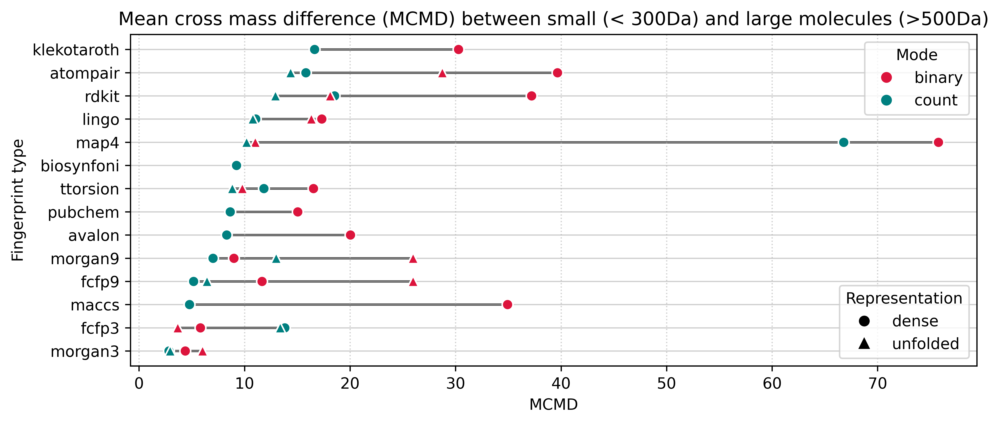

In [45]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def split_type_mode_sparse(exp_name: str):
    s = str(exp_name)

    # mode
    if re.search(r"(^|_)logcount($|_)", s):
        mode = "logcount"
    elif re.search(r"(^|_)count($|_)", s):
        mode = "count"
    elif re.search(r"(^|_)binary($|_)", s):
        mode = "binary"
    else:
        mode = "other"

    # sparse/dense marker group
    marker_group = "dense"
    if re.search(r"(^|_)sparse($|_)", s):
        marker_group = "sparse"

    # base fingerprint type: strip known suffix tokens
    base = s
    base = re.sub(r"(^|_)logcount($|_)", "_", base)
    base = re.sub(r"(^|_)count($|_)", "_", base)
    base = re.sub(r"(^|_)binary($|_)", "_", base)
    base = re.sub(r"(^|_)sparse($|_)", "_", base)
    base = re.sub(r"__+", "_", base).strip("_")

    fingerprint_type = base

    # connect group (connect count vs binary within the same sparse/dense, if you want)
    connect_group = f"{fingerprint_type}__{marker_group}"

    return fingerprint_type, mode, marker_group, connect_group


# Build tidy plotting columns
#mask = ["logcount" not in x for x in results.experiment]
results_df = results.copy()[mask]
results_df[["fingerprint_type", "mode", "marker_group", "connect_group"]] = results_df["experiment"].apply(
    lambda x: pd.Series(split_type_mode_sparse(x))
)

plot_df = results_df[["fingerprint_type", "MCMD", "mode", "marker_group", "connect_group"]].copy()


LOWER_IS_BETTER = True
order = (
    plot_df.groupby("fingerprint_type")["MCMD"]
    .min() if LOWER_IS_BETTER else plot_df.groupby("fingerprint_type")["MCMD"].max()
)
order = order.sort_values(ascending=True).index.tolist()  # best on top after invert_yaxis

SETTING_COLORS = {
    "binary": "crimson",
    "count": "teal",
    "logcount": "dodgerblue",
}

MARKERS = {
    "dense": "o",
    "sparse": "^",
}

marker_group_for_legend = plot_df["marker_group"].replace({"sparse": "unfolded"})
marker_map_for_legend = {"dense": MARKERS["dense"], "unfolded": MARKERS["sparse"]}

fig, ax = cleveland_dotplot(
    row=plot_df["fingerprint_type"].tolist(),
    x=plot_df["MCMD"].to_numpy(),
    color_group=plot_df["mode"].tolist(),
    marker_group=marker_group_for_legend,
    connect_group=plot_df["connect_group"].tolist(),
    connect=False,  # set True if you want to connect dense<->sparse or binary<->count (see note below)
    row_order=order[::-1],
    title="Mean cross mass difference (MCMD) between small (< 300Da) and large molecules (>500Da)",
    xlabel="MCMD",
    color_map=SETTING_COLORS,
    marker_map=marker_map_for_legend,
    marker_legend_title="Representation",
    color_legend_title="Mode",
    color_legend_position="upper right",
)

ax.set_ylabel("Fingerprint type")
ax.invert_yaxis()
plt.tight_layout()
#plt.savefig("mcmd_all.png", dpi=300)
#plt.savefig("mcmd_all.pdf")
plt.show()

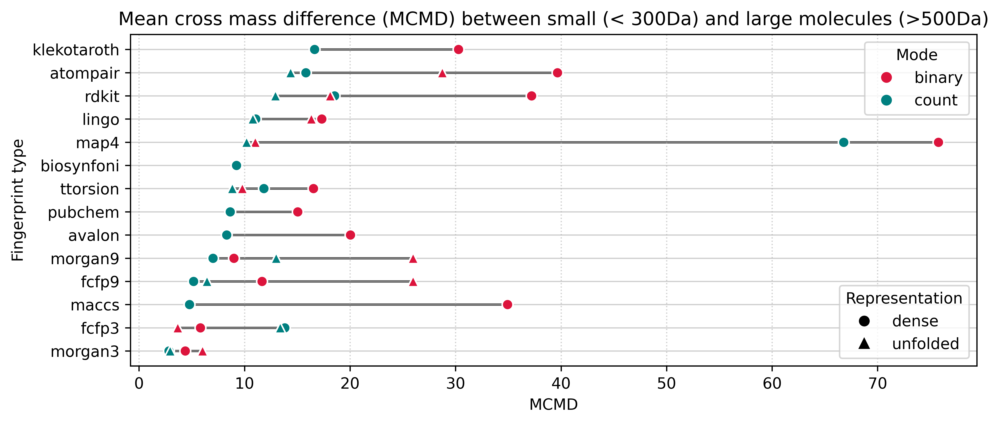

In [16]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def split_type_mode_sparse(exp_name: str):
    s = str(exp_name)

    # mode
    if re.search(r"(^|_)count($|_)", s):
        mode = "count"
    elif re.search(r"(^|_)binary($|_)", s):
        mode = "binary"
    else:
        mode = "other"

    # sparse/dense marker group
    marker_group = "dense"
    if re.search(r"(^|_)sparse($|_)", s):
        marker_group = "sparse"

    # base fingerprint type: strip known suffix tokens
    base = s
    base = re.sub(r"(^|_)count($|_)", "_", base)
    base = re.sub(r"(^|_)binary($|_)", "_", base)
    base = re.sub(r"(^|_)sparse($|_)", "_", base)
    base = re.sub(r"__+", "_", base).strip("_")

    fingerprint_type = base

    # connect group (connect count vs binary within the same sparse/dense, if you want)
    connect_group = f"{fingerprint_type}__{marker_group}"

    return fingerprint_type, mode, marker_group, connect_group


# Build tidy plotting columns
mask = ["logcount" not in x for x in results.experiment]
results_df = results.copy()[mask]
results_df[["fingerprint_type", "mode", "marker_group", "connect_group"]] = results_df["experiment"].apply(
    lambda x: pd.Series(split_type_mode_sparse(x))
)

plot_df = results_df[["fingerprint_type", "MCMD", "mode", "marker_group", "connect_group"]].copy()


LOWER_IS_BETTER = True
order = (
    plot_df.groupby("fingerprint_type")["MCMD"]
    .min() if LOWER_IS_BETTER else plot_df.groupby("fingerprint_type")["MCMD"].max()
)
order = order.sort_values(ascending=True).index.tolist()  # best on top after invert_yaxis

SETTING_COLORS = {
    "binary": "crimson",
    "count": "teal",
    "other": "gray",
}

MARKERS = {
    "dense": "o",
    "sparse": "^",
}

marker_group_for_legend = plot_df["marker_group"].replace({"sparse": "unfolded"})
marker_map_for_legend = {"dense": MARKERS["dense"], "unfolded": MARKERS["sparse"]}

fig, ax = cleveland_dotplot(
    row=plot_df["fingerprint_type"].tolist(),
    x=plot_df["MCMD"].to_numpy(),
    color_group=plot_df["mode"].tolist(),
    marker_group=marker_group_for_legend,
    connect_group=plot_df["connect_group"].tolist(),
    connect=False,  # set True if you want to connect dense<->sparse or binary<->count (see note below)
    row_order=order[::-1],
    title="Mean cross mass difference (MCMD) between small (< 300Da) and large molecules (>500Da)",
    xlabel="MCMD",
    color_map=SETTING_COLORS,
    marker_map=marker_map_for_legend,
    marker_legend_title="Representation",
    color_legend_title="Mode",
    color_legend_position="upper right",
)

ax.set_ylabel("Fingerprint type")
ax.invert_yaxis()
plt.tight_layout()
plt.savefig("mcmd_all.png", dpi=300)
plt.savefig("mcmd_all.pdf")
plt.show()

In [23]:
selected_experiments = {
    "Tanimoto (rdkit)": "rdkit_binary.csv",
    "Tanimoto (rdkit count)": "rdkit_count.csv",
    "Tanimoto (MAP4)": "map4_binary.csv",
    "Tanimoto (Morgan-3)": "morgan3_binary.csv",
    "Tanimoto (Morgan-3 count)": "morgan3_count.csv",
    "Tanimoto (Morgan-9 count)": "morgan9_count.csv",
}

selected_experiments_keys = list(selected_experiments.keys())
selected_experiments_vals = list(selected_experiments.values())

In [24]:
selected_experiments_vals

['rdkit_binary.csv',
 'rdkit_count.csv',
 'map4_binary.csv',
 'morgan3_binary.csv',
 'morgan3_count.csv',
 'morgan9_count.csv']

In [15]:
import glob

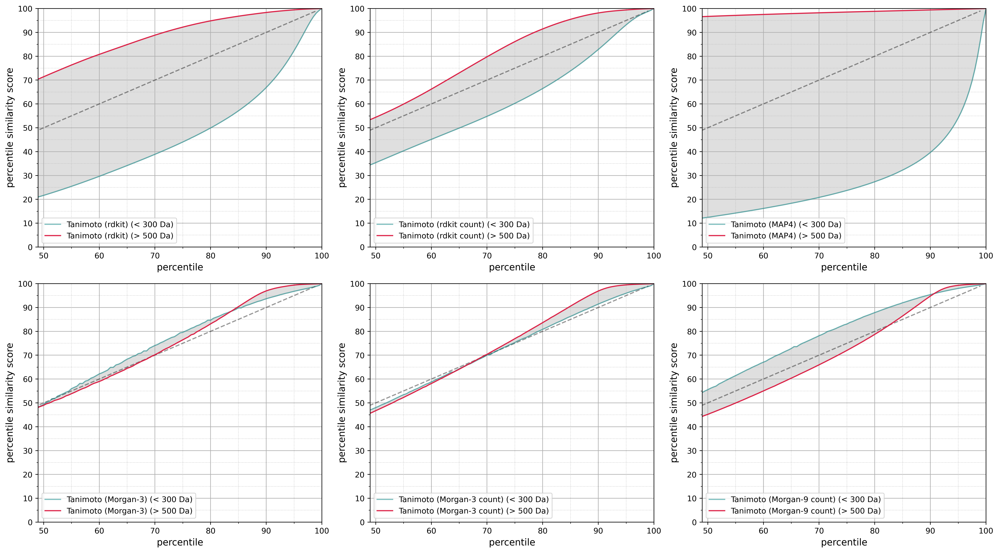

In [27]:
csv_pattern = os.path.join(path_results, "cross_mass_percentiles_*.csv")
csv_files = sorted(glob.glob(csv_pattern))

percentiles_data = np.linspace(0, 100, 201)
percentiles_ticks = [50,  60, 70, 80, 90, 100]
y_ticks = np.arange(0, 110, 10)

mass_low = 300
mass_high = 500


# Compare selected percentiles
fig, axes = plt.subplots(2, 3, figsize=(18, 10), dpi=400)
axes = axes.ravel()

colors = ["darkblue", "#277DA1", #"#4D908E", 
          "#F94144", "#F8961E", "#F9C74F"]

curves =  {key: {} for key in selected_experiments_keys}

x_low = 49
x_high = 100
y_low = 0
y_high = 100


for file in csv_files:
    for i, exp in enumerate(selected_experiments_vals):
        if exp in file:
            
            key = selected_experiments_keys[i]
            df = pd.read_csv(file)
            df.index = percentiles_data

            curves[key][mass_low] = df.perc_low
            axes[i].plot(np.arange(0, 100), np.arange(0, 100), "--", color="black", alpha=0.4)

            axes[i].plot(
                percentiles_data, df.perc_low,
                #"--", #markersize=8,
                label=key+f" (< {mass_low} Da)", color="teal", alpha=0.5
            )
            curves[key][mass_high] = df.perc_high
            axes[i].plot(
                percentiles_data, df.perc_high,
                #"--", #markersize=8,
                label=key+f" (> {mass_high} Da)", color="crimson", alpha=0.9
            )

for i, key in enumerate(selected_experiments_keys):
    axes[i].fill_between(
        percentiles_data,
        curves[key][mass_low], curves[key][mass_high], color="gray", alpha=0.25)

    axes[i].set_xticks(percentiles_ticks, [str(x) for x in percentiles_ticks])
    axes[i].set_yticks(y_ticks, [str(y) for y in y_ticks])
    axes[i].grid(True)
    ax = axes[i]
    minor_yticks = np.arange(y_low + 5, y_high, 10)
    minor_xticks = np.arange(55, x_high, 10)
    ax.set_yticks(minor_yticks, minor=True)
    ax.set_xticks(minor_xticks, minor=True)
    ax.grid(which='minor', linestyle=':', linewidth=0.7, alpha=0.7)
    
    axes[i].set_xlabel("percentile", fontsize=12)
    axes[i].set_ylabel("percentile similarity score", fontsize=12)
    axes[i].set_ylim(y_low, y_high)
    axes[i].set_xlim(x_low, x_high)
    axes[i].legend(fontsize=10, loc="lower left")

plt.tight_layout()
plt.savefig("fig_low_high_mass_score_percentiles_scaled.pdf")
plt.savefig("fig_low_high_mass_score_percentiles_scaled.png", dpi=450)
plt.show()